# Comparing models trained with LFP loss vs not

Looking at the saved neural data from these models

In [1]:
import os, scipy.io 
import numpy as np 
# %matplotlib ipympl
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import axes3d
import pickle as pk
import sys
import importlib
from mne.time_frequency import tfr_array_morlet


sys.path.append('/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils')
import load_data as ld
import population_utils as pu

## get list of trained models

In [2]:
# lfp models (lfp) — theta 4.0

lfp_model_dir = '/home/nuttidalab/Documents/renee/lfp_input_models_wtrain/models/xor/phase/P_rec_0.2_Taus_4.0_25.0'
# lfp_model_list = os.listdir(lfp_model_dir)
# lfp_model_list = [m for m in lfp_model_list if m.endswith('.mat') and m.]
lfp_theta4_model_list = ld.find_files_keywords(lfp_model_dir, ['Jitter_10_10', '4.0', '.mat'])
# remove directories 
lfp_theta4_model_list = [m.split('/')[-1] for m in lfp_theta4_model_list]
lfp_theta4_model_list.sort()

# print(lfp_theta4_model_list)
print(len(lfp_theta4_model_list))

perfs4 = []
train_trials = []
for i, model_name in enumerate(lfp_theta4_model_list):
    model_path = os.path.join(lfp_model_dir, model_name)
    model_data = scipy.io.loadmat(model_path)
    perfs4.append(model_data['eval_perf_mean'][0][0])
    train_trials.append(model_data['tr'][0][0])
    print(f'Model: {model_name}, Test perf: {perfs4[i]}, Train trials: {train_trials[i]}')

12
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134255.mat, Test perf: 0.99, Train trials: 4801
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134527.mat, Test perf: 0.97, Train trials: 7201
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134559.mat, Test perf: 0.99, Train trials: 10201
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_134903.mat, Test perf: 0.96, Train trials: 11001
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_135100.mat, Test perf: 0.99, Train trials: 5001
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_135226.mat, Test perf: 0.97, Train trials: 5801
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_135856.mat, Test perf: 1.0, Train trials: 7201
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_140038.mat, Test perf: 0.98, Train trials: 10501
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_4.0_2025_09_19_140105.mat, Test perf: 0.99, Train trials: 7901
Model: Task_xor_N_200_Jitter_10_

In [3]:
# lfp models (lfp) — theta 8.0

lfp_model_dir = '/home/nuttidalab/Documents/renee/lfp_input_models_wtrain/models/xor/phase/P_rec_0.2_Taus_4.0_25.0'
# lfp_model_list = os.listdir(lfp_model_dir)
# lfp_model_list = [m for m in lfp_model_list if m.endswith('.mat') and m.]
lfp_theta8_model_list = ld.find_files_keywords(lfp_model_dir, ['Jitter_10_10', '8.0', '.mat'])

# remove directories 
lfp_theta8_model_list = [m.split('/')[-1] for m in lfp_theta8_model_list]
lfp_theta8_model_list.sort()

# print(lfp_theta8_model_list)
print(len(lfp_theta8_model_list))

perfs8 = []
train_trials = []
for i, model_name in enumerate(lfp_theta8_model_list):
    model_path = os.path.join(lfp_model_dir, model_name)
    model_data = scipy.io.loadmat(model_path)
    perfs8.append(model_data['eval_perf_mean'][0][0])
    train_trials.append(model_data['tr'][0][0])
    print(f'Model: {model_name}, Test perf: {perfs8[i]}, Train trials: {train_trials[i]}')

9
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_164720.mat, Test perf: 0.99, Train trials: 17701
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_165210.mat, Test perf: 0.97, Train trials: 22501
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_172818.mat, Test perf: 0.97, Train trials: 9001
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_173020.mat, Test perf: 0.98, Train trials: 28101
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_173852.mat, Test perf: 0.96, Train trials: 15201
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_174325.mat, Test perf: 0.99, Train trials: 25701
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_175136.mat, Test perf: 0.99, Train trials: 11201
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_175605.mat, Test perf: 0.97, Train trials: 12001
Model: Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_19_175839.mat, Test perf: 0.99, Train trials: 24101


In [6]:
# remove models with less than 95% performance

import os

def remove_low_perf_models(model_list, model_dir, perf_thresh=0.95):
    good_models = []
    for i, model_name in enumerate(model_list):
        model_path = os.path.join(model_dir, model_name)
        model_data = scipy.io.loadmat(model_path)
        perf = model_data['eval_perf_mean'][0][0]
        if perf < perf_thresh:
            print(f'Removing model {model_name} with performance {perf}')
            os.remove(model_path)
    return 

remove_low_perf_models(lfp_theta4_model_list, lfp_model_dir, perf_thresh=0.95)
remove_low_perf_models(lfp_theta8_model_list, lfp_model_dir, perf_thresh=0.95)

Removing model Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_16_140343.mat with performance 0.0
Removing model Task_xor_N_200_Jitter_10_10_LFPdelay_8.0_2025_09_16_151444.mat with performance 0.0


(3, 300)


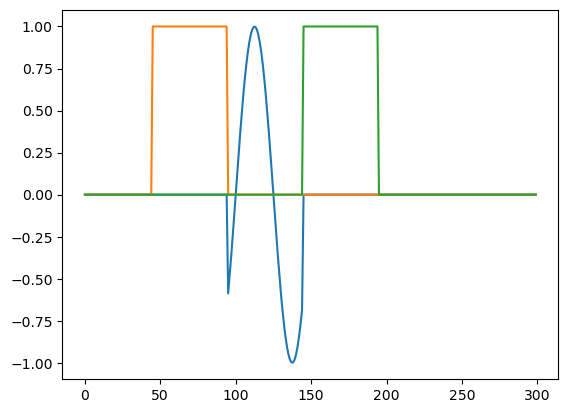

In [ ]:
# 4Hz model example
print(model_data['u'].shape)
plt.plot(model_data['u'][2,:])
plt.plot(model_data['u'][0,:])
plt.plot(model_data['u'][1,:])
plt.show()

(3, 300)


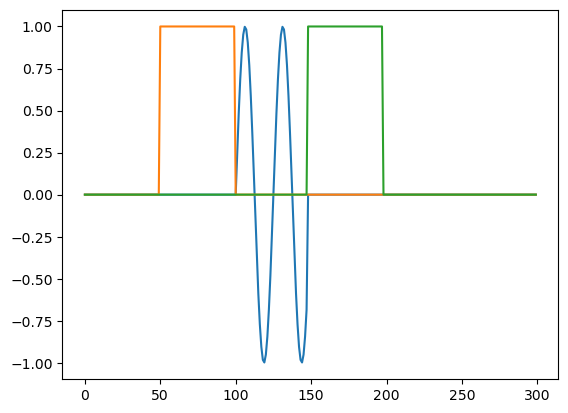

In [ ]:
# 8Hz model example
print(model_data['u'].shape)
plt.plot(model_data['u'][2,:])
plt.plot(model_data['u'][0,:])
plt.plot(model_data['u'][1,:])
plt.show()

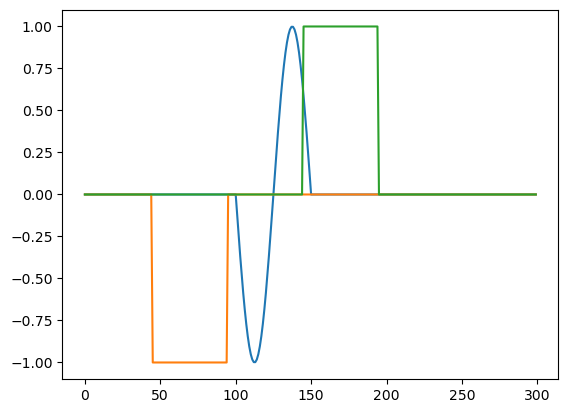

In [19]:
import sys
sys.path.append('/home/nuttidalab/Documents/renee/spikeRNN/rate')
import model
from model import generate_input_stim_xor, generate_LFP_input_phase

settings = {
            'T': 300, # trial duration (in steps)
            'stim_on': 50, # input stim onset (in steps)
            'stim_dur': 50, # input stim duration (in steps)
            'delay': 50, # delay b/w the two stimuli (in steps)
            'DeltaT': 1, # sampling rate
            'taus': [4.0, 25.0], # synaptic time constants (in ms)
            'fs': 200, # sampling rate (Hz)
            'lfp_power_target': [4], # target power for the LFP
            'power_target_period': 'delay', # period during which to compute LFP power
            'task': 'xor', # task name
            }

u = model_data['u'][:2,:]  # shape (2, T)
u[0,:] *= -1
u = generate_LFP_input_phase(settings, u)
plt.plot(u[2,:])
plt.plot(u[0,:])
plt.plot(u[1,:])
plt.show()

## study models

### dict keys
neural_dict has 2 keys:
- 'r' is trials x neurons x time
- 'epsp' is trials x time

bhv_dict has 2 keys:
- 'perf' is trials (0/1)
- 'trial_type' is list of length trials
    - if changed to np.array, is trials x 2

In [ ]:
# delay150
settings = {
        'T': 400, # trial duration (in steps)
        'stim_on': 50, # input stim onset (in steps)
        'stim_dur': 50, # input stim duration (in steps)
        'delay': 150, # delay b/w the two stimuli (in steps)
        'DeltaT': 1, # sampling rate
        'taus': 20, # decay time-constants (in steps)
        'lfp_power_target': [4, 8], # theta
        'fs': 200,
        'task': 'xor', # task name
        }

In [4]:
# delay400
settings = {
        'T': 650, # trial duration (in steps)
        'stim_on': 50, # input stim onset (in steps)
        'stim_dur': 50, # input stim duration (in steps)
        'delay': 400, # delay b/w the two stimuli (in steps)
        'DeltaT': 1, # sampling rate
        'taus': 20, # decay time-constants (in steps)
        'lfp_power_target': [4], # theta
        'power_target_period': 'delay',
        'fs': 200,
        'task': 'xor', # task name
        }

In [4]:
# delay400 -- longer fixation period
settings = {
        'T': 700, # trial duration (in steps)
        'stim_on': 100, # input stim onset (in steps)
        'stim_dur': 50, # input stim duration (in steps)
        'delay': 400, # delay b/w the two stimuli (in steps)
        'DeltaT': 1, # sampling rate
        'taus': 20, # decay time-constants (in steps)
        'lfp_power_target': [4], # theta
        'power_target_period': 'delay',
        'fs': 200,
        'task': 'xor', # task name
        }

In [ ]:
# base code for loading data for each model type

model_lists = [xlfp_model_list, lfp_theta4_model_list] #, lfp_alpha_model_list]
model_dirs = [xlfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['xlfp', 'lfp_theta'] #, 'lfp_alpha']

for model_lists, model_dirs, model_list_names in zip(model_lists, model_dirs, model_list_names):
    model_list = model_lists
    model_dir = model_dirs
    model_list_name = model_list_names

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

    for model_name in model_list:
        print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, 'neural_dict.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, 'bhv_dict.pkl'), 'rb'))

        break
    break


### simple behavior plots

In [5]:
avg_perf_lfp4 = []
avg_perf_lfp8 = []

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] 
model_dirs = [lfp_model_dir, lfp_model_dir] 
model_list_names = ['lfp_theta4', 'lfp_theta8'] 
condn = 'delay400_stimon100'

for model_list, model_dir, model_list_name in zip(model_lists, model_dirs, model_list_names):
    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        if model_list_name == 'lfp_theta4':
            avg_perf_lfp4.append(np.mean(bhv_dict['perf']))
        elif model_list_name == 'lfp_theta8':
            avg_perf_lfp8.append(np.mean(bhv_dict['perf']))

print(f'LFP 4Hz avg perf: {np.mean(avg_perf_lfp4)}, std: {np.std(avg_perf_lfp4)}')
print(f'LFP 8Hz avg perf: {np.mean(avg_perf_lfp8)}, std: {np.std(avg_perf_lfp8)}')

LFP 4Hz avg perf: 0.8649999999999999, std: 0.14320730893824285
LFP 8Hz avg perf: 0.5477777777777777, std: 0.17112554051714185


/tmp/ipykernel_1032485/1649201596.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([perfs4, avg_perf_lfp4], labels=['Delay=50', 'Delay=400'])


Wilcoxon test statistic: 0.00, p-value: 0.00


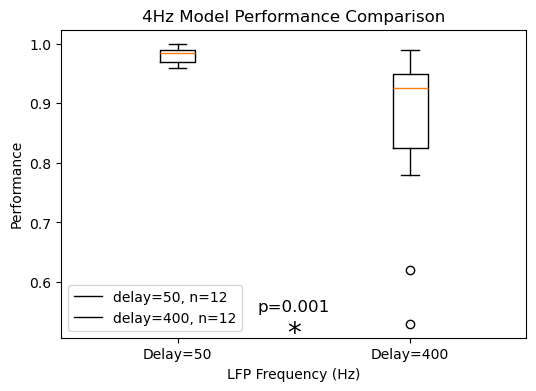

In [6]:
# box plots comparing model perfs pre and post training, 4Hz models

plt.figure(figsize=(6,4))
plt.boxplot([perfs4, avg_perf_lfp4], labels=['Delay=50', 'Delay=400'])

from scipy.stats import wilcoxon
stat, p = wilcoxon(perfs4, avg_perf_lfp4)
print("Wilcoxon test statistic: %.2f, p-value: %.2f" % (stat, p))
if p<0.05:
    plt.text(1.5, 0.5, '*', fontsize=20, ha='center')
plt.text(1.5, 0.55, f'p={p:.3f}', fontsize=12, ha='center')


plt.ylabel('Performance')
plt.xlabel('LFP Frequency (Hz)')
plt.title('4Hz Model Performance Comparison')
plt.legend([f'delay=50, n={len(perfs4)}', f'delay=400, n={len(avg_perf_lfp4)}'])
# plt.grid()
plt.show()

Wilcoxon test statistic: 0.00, p-value: 0.00


/tmp/ipykernel_1032485/2966280501.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([perfs8, avg_perf_lfp8], labels=['Delay=50', 'Delay=400'])


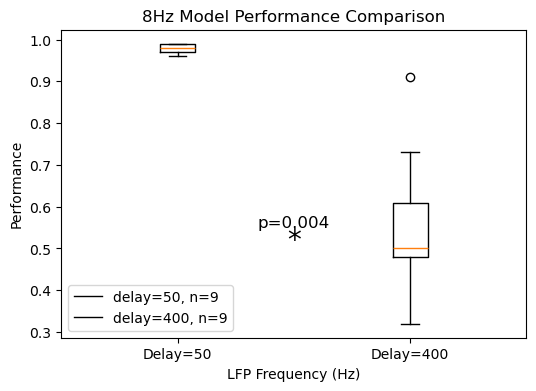

In [7]:
# box plots comparing model perfs from pre and post training, 8Hz models

plt.figure(figsize=(6,4))
plt.boxplot([perfs8, avg_perf_lfp8], labels=['Delay=50', 'Delay=400'])

from scipy.stats import wilcoxon
stat, p = wilcoxon(perfs8, avg_perf_lfp8)
print("Wilcoxon test statistic: %.2f, p-value: %.2f" % (stat, p))
if p<0.05:
    plt.text(1.5, 0.5, '*', fontsize=20, ha='center')
plt.text(1.5, 0.55, f'p={p:.3f}', fontsize=12, ha='center')


plt.ylabel('Performance')
plt.xlabel('LFP Frequency (Hz)')
plt.title('8Hz Model Performance Comparison')
plt.legend([f'delay=50, n={len(perfs8)}', f'delay=400, n={len(avg_perf_lfp8)}'])
# plt.grid()
plt.show()

Mann-Whitney U test statistic: 100.50, p-value: 0.00


/tmp/ipykernel_1032485/563097242.py:4: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([avg_perf_lfp4, avg_perf_lfp8], labels=['LFP 4Hz', 'LFP 8Hz'])


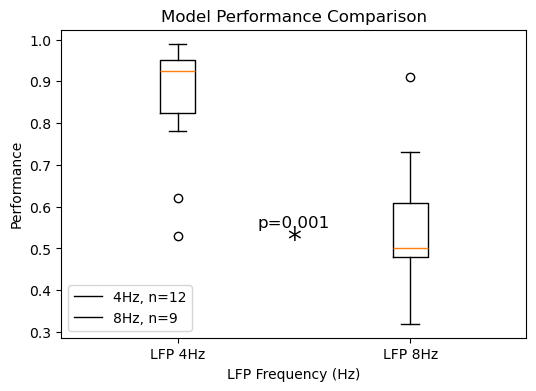

In [8]:
# box plots comparing model perfs from both groups, with stats 

plt.figure(figsize=(6,4))
plt.boxplot([avg_perf_lfp4, avg_perf_lfp8], labels=['LFP 4Hz', 'LFP 8Hz'])

from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(avg_perf_lfp4, avg_perf_lfp8)
print("Mann-Whitney U test statistic: %.2f, p-value: %.2f" % (stat, p))
if p<0.05:
    plt.text(1.5, 0.5, '*', fontsize=20, ha='center')
plt.text(1.5, 0.55, f'p={p:.3f}', fontsize=12, ha='center')


plt.ylabel('Performance')
plt.xlabel('LFP Frequency (Hz)')
plt.title('Model Performance Comparison')
plt.legend([f'4Hz, n={len(avg_perf_lfp4)}', f'8Hz, n={len(avg_perf_lfp8)}'])
# plt.grid()
plt.show()

### Connectivity plots

In [7]:
import sys
sys.path.append('/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils')
import connectivity_utils as cu

Processing model type: lfp_theta4, number of models: 12


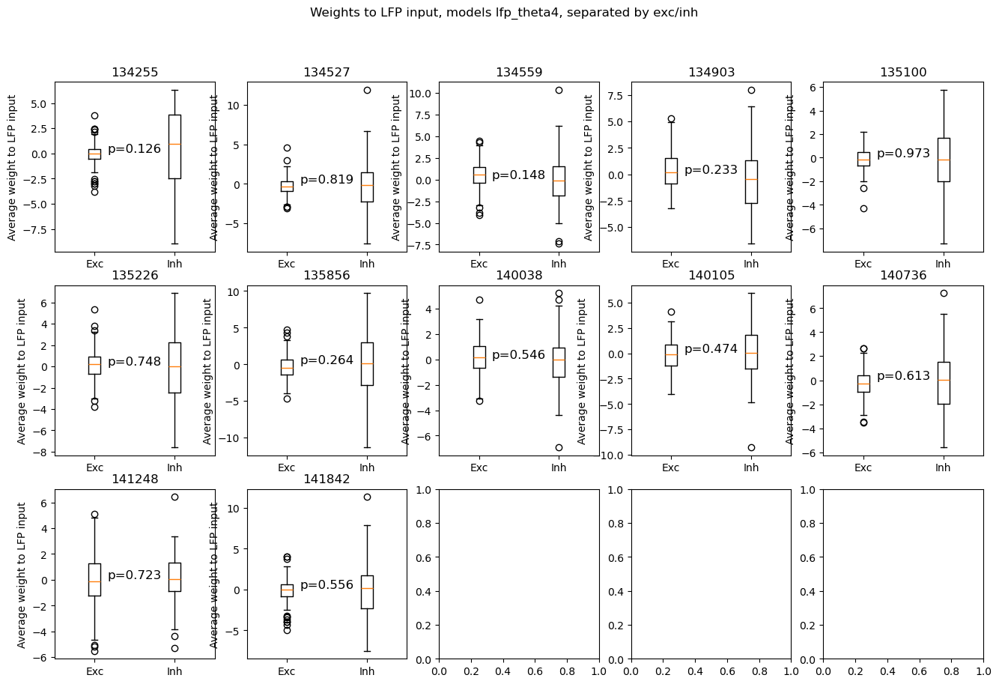

Processing model type: lfp_theta8, number of models: 9


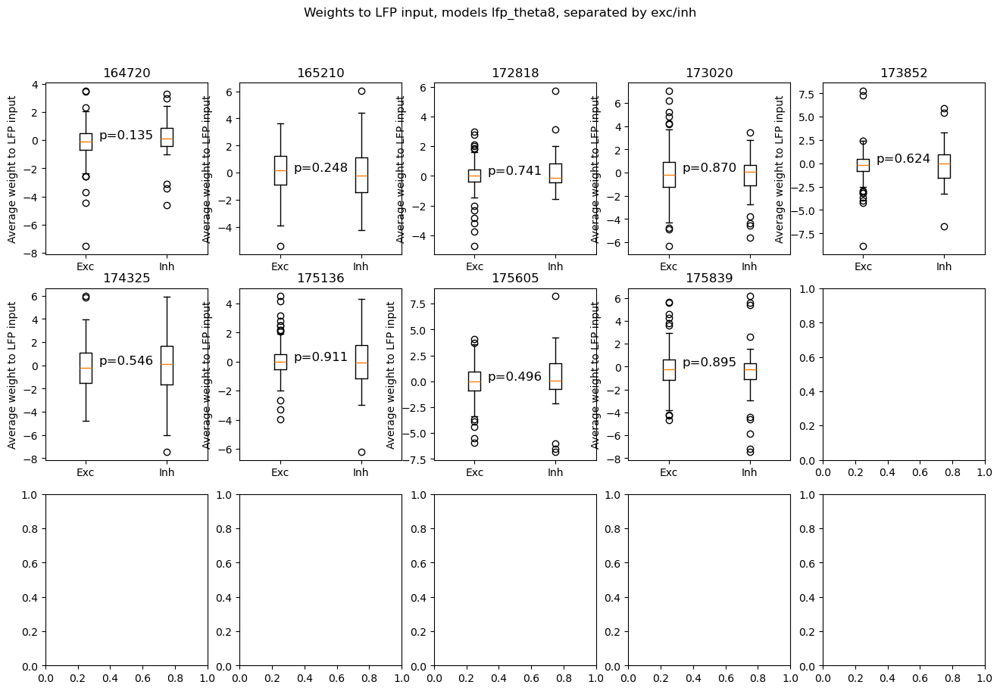

In [10]:
from scipy.stats import mannwhitneyu

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] 
model_dirs = [lfp_model_dir, lfp_model_dir] 
model_list_names = ['lfp_theta4', 'lfp_theta8']

for (model_list, model_dir, model_list_name) in zip(model_lists, model_dirs, model_list_names):
    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    fig, axs = plt.subplots(3,5, figsize=(16,10))
    axs = axs.flatten()
    for i, model_name in enumerate(model_list):
        model_path = os.path.join(lfp_model_dir, model_name)
        model_data = scipy.io.loadmat(model_path)
        
        w_in_lfp = np.squeeze(model_data['w_in_lfp'])
        exc_ind = np.where(model_data['exc']==1)[0]
        inh_ind = np.where(model_data['exc']==0)[0]
        
        axs[i].boxplot([w_in_lfp[exc_ind], w_in_lfp[inh_ind]])
        axs[i].set_xticklabels(['Exc', 'Inh'])
        stat, p = mannwhitneyu(w_in_lfp[exc_ind], w_in_lfp[inh_ind])
        # print("Mann-Whitney U test statistic: %.2f, p-value: %.2f" % (stat, p))
        if p<0.05:
            axs[i].text(1.5, 0.1, '*', fontsize=20, ha='center')
        axs[i].text(1.5, 0.1, f'p={p:.3f}', fontsize=12, ha='center')
        axs[i].set_ylabel('Average weight to LFP input')
        axs[i].set_title(f'{model_name[-10:-4]}')
    plt.suptitle(f'Weights to LFP input, models {model_list_name}, separated by exc/inh')
    plt.show()

Processing model type: lfp_theta4, number of models: 12


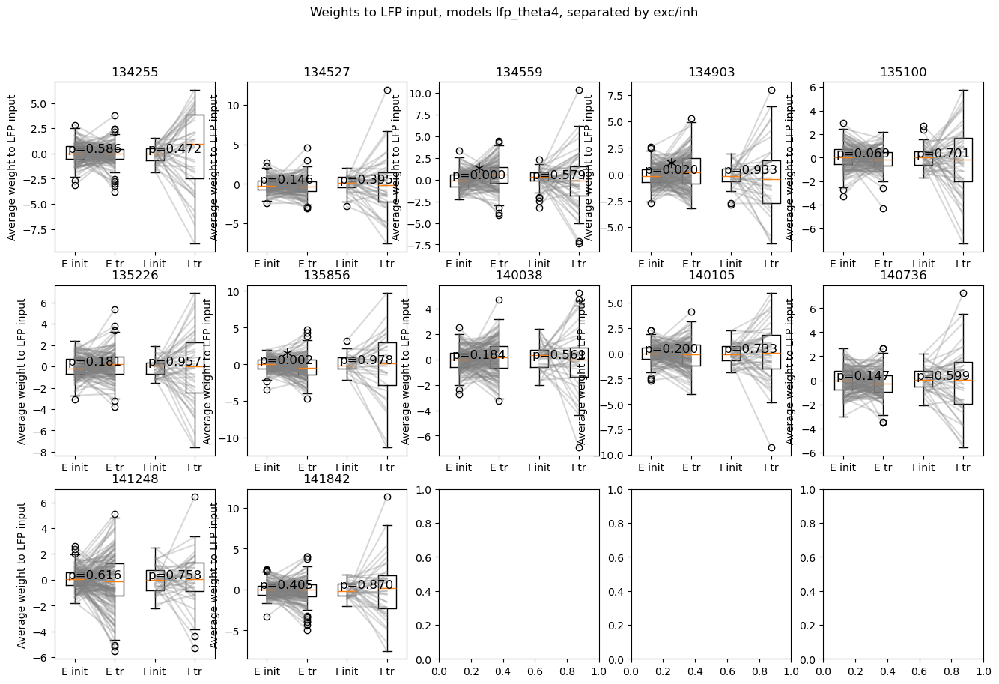

Processing model type: lfp_theta8, number of models: 9


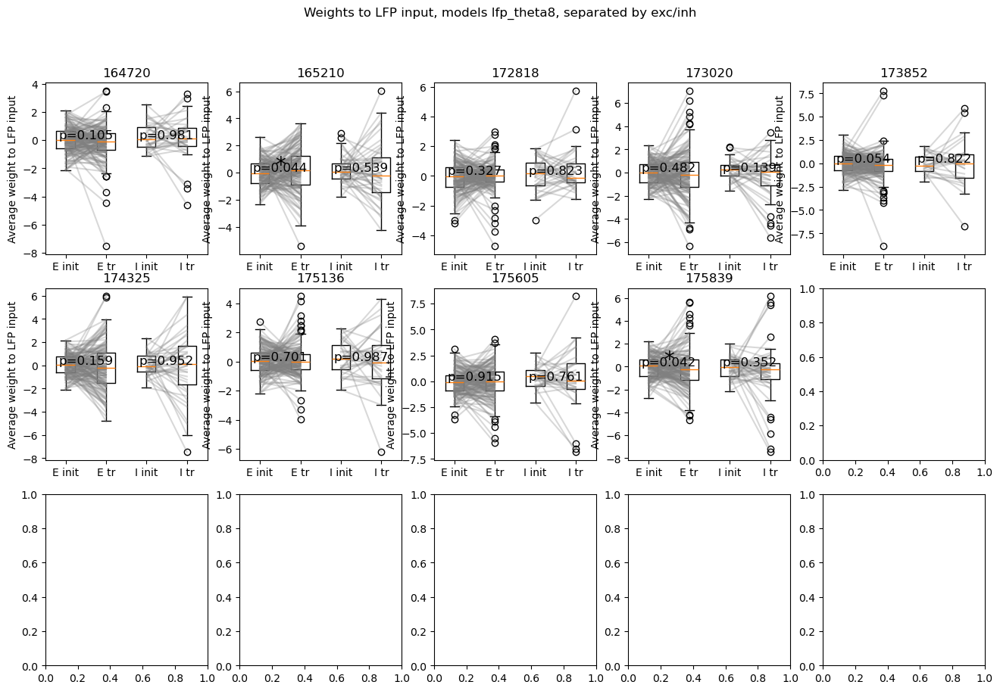

In [11]:
from scipy.stats import wilcoxon

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] #, lfp_alpha_model_list]
model_dirs = [lfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['lfp_theta4', 'lfp_theta8'] #, 'lfp_alpha']

for (model_list, model_dir, model_list_name) in zip(model_lists, model_dirs, model_list_names):
    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    fig, axs = plt.subplots(3,5, figsize=(16,10))
    axs = axs.flatten()
    for i, model_name in enumerate(model_list):
        model_path = os.path.join(lfp_model_dir, model_name)
        model_data = scipy.io.loadmat(model_path)
        
        w_in_lfp = np.squeeze(model_data['w_in_lfp'])
        w_in_lfp0 = np.squeeze(model_data['w_in_lfp0'])
        exc_ind = np.where(model_data['exc']==1)[0]
        inh_ind = np.where(model_data['exc']==0)[0]
        
        axs[i].boxplot([w_in_lfp0[exc_ind], w_in_lfp[exc_ind],  w_in_lfp0[inh_ind], w_in_lfp[inh_ind]])
        axs[i].set_xticklabels(['E init', 'E tr', 'I init', 'I tr'])
        # plot gray lines
        for j in range(len(exc_ind)):
            axs[i].plot([1, 2], [w_in_lfp0[exc_ind][j], w_in_lfp[exc_ind][j]], color='gray', alpha=0.3)
        for j in range(len(inh_ind)):
            axs[i].plot([3, 4], [w_in_lfp0[inh_ind][j], w_in_lfp[inh_ind][j]], color='gray', alpha=0.3)
        stat, p = wilcoxon(w_in_lfp0[exc_ind], w_in_lfp[exc_ind])
        axs[i].text(1.5, 0.1, f'p={p:.3f}', fontsize=12, ha='center')
        if p<0.05:
            axs[i].text(1.5, 0.1, '*', fontsize=20, ha='center')
        stat, p = wilcoxon(w_in_lfp0[inh_ind], w_in_lfp[inh_ind])
        axs[i].text(3.5, 0.1, f'p={p:.3f}', fontsize=12, ha='center')
        if p<0.05:
            axs[i].text(3.5, 0.1, '*', fontsize=20, ha='center')
        axs[i].set_ylabel('Average weight to LFP input')
        axs[i].set_title(f'{model_name[-10:-4]}')
    plt.suptitle(f'Weights to LFP input, models {model_list_name}, separated by exc/inh')
    plt.show()

Mann-Whitney U test statistic: 67.00, p-value: 0.80


/tmp/ipykernel_899367/1447785612.py:15: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([avg_weight_exc, avg_weight_inh], labels=['Exc', 'Inh'])


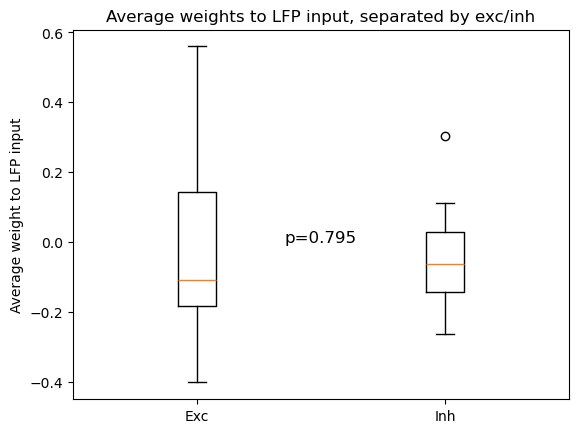

In [26]:
avg_weight_exc = []
avg_weight_inh = []
for i, model_name in enumerate(lfp_theta4_model_list):
    model_path = os.path.join(lfp_model_dir, model_name)
    model_data = scipy.io.loadmat(model_path)
    
    w_in_lfp = np.squeeze(model_data['w_in_lfp'])
    exc_ind = np.where(model_data['exc']==1)[0]
    inh_ind = np.where(model_data['exc']==0)[0]
    
    avg_weight_exc.append(np.mean(w_in_lfp[exc_ind]))
    avg_weight_inh.append(np.mean(w_in_lfp[inh_ind]))
    
plt.figure()
plt.boxplot([avg_weight_exc, avg_weight_inh], labels=['Exc', 'Inh'])
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(avg_weight_exc, avg_weight_inh)
print("Mann-Whitney U test statistic: %.2f, p-value: %.2f" % (stat, p))
if p<0.05:
    plt.text(1.5, 0, '*', fontsize=20, ha='center')
plt.text(1.5, 0, f'p={p:.3f}', fontsize=12, ha='center')
plt.ylabel('Average weight to LFP input')
plt.title('Average weights to LFP input, separated by exc/inh')
plt.show()

### Plot rate trajectories

Processing model type: lfp_theta4, number of models: 12
PCA explained variance: [0.49159032 0.14628254 0.09176362], total: 0.7296364849109653
PCA explained variance: [0.4487002  0.18444139 0.10069158], total: 0.7338331672273664
PCA explained variance: [0.63876491 0.13169939 0.07297254], total: 0.8434368396893676
PCA explained variance: [0.55527239 0.15052778 0.07880911], total: 0.7846092819481402
PCA explained variance: [0.44016231 0.26598635 0.06605733], total: 0.772205996033778
PCA explained variance: [0.56171768 0.10219986 0.08661507], total: 0.7505326074785489
PCA explained variance: [0.51257147 0.13992642 0.13296267], total: 0.7854605655646545
PCA explained variance: [0.53134074 0.13458731 0.10166903], total: 0.7675970779055613
PCA explained variance: [0.49871801 0.13412695 0.12865355], total: 0.7614985119442353
PCA explained variance: [0.40446693 0.28335059 0.09152335], total: 0.7793408693806605
PCA explained variance: [0.44410274 0.16224376 0.13970552], total: 0.7460520231552304

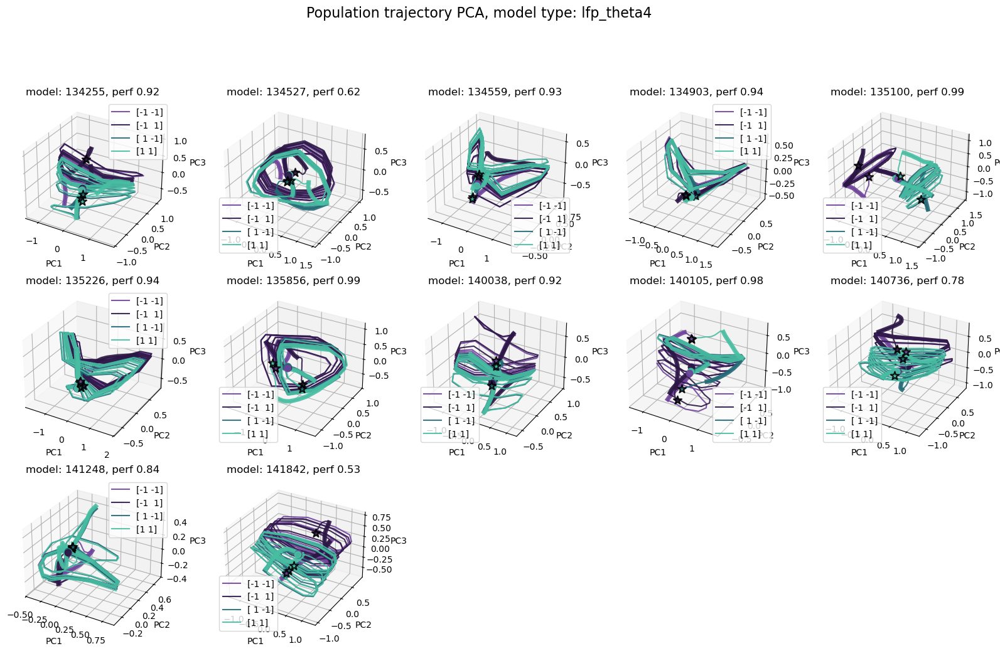

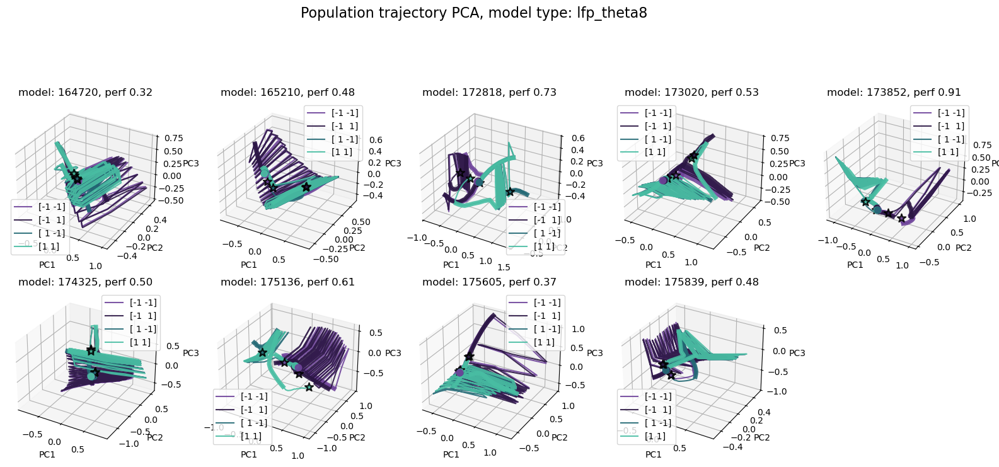

In [9]:
model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] #, lfp_alpha_model_list]
model_dirs = [lfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['lfp_theta4', 'lfp_theta8'] #, 'lfp_alpha']
condn = 'delay400_stimon100'

for model_lists, model_dirs, model_list_names in zip(model_lists, model_dirs, model_list_names):
    model_list = model_lists
    model_dir = model_dirs
    model_list_name = model_list_names

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig = plt.figure(figsize=(20, 15))

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        ax = fig.add_subplot(4, 5, model_list.index(model_name)+1, projection='3d')
        ax, _ = pu.plot_trajectory_pca(rates_data=neural_dict['r'], trial_labels=np.array(bhv_dict['trial_type']), 
                       settings=settings, cut_off=50, plot=1, ds=5, smooth=2, ax=ax,
                       title=f'model: {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    
    fig.suptitle(f'Population trajectory PCA, model type: {model_list_name}', fontsize=16)


### plot EPSP

In [4]:
def compute_lfp_power(epsps, settings, freq_range = [4, 100], num_freqs = 40, n_cycles=7):
    """
    Compute LFP power in specified frequency range using Morlet wavelet transform.
    
    Parameters:
    epsps : array
        The excitatory post-synaptic potentials (shape: trials, n_timepoints).
    settings : dict
        Dictionary containing settings such as 'fs' (sampling rate).
    freq_range : list
        List of frequencies to compute power for.
    num_freqs : int
        Number of frequency bins.
    n_cycles : int
        Number of cycles for the Morlet wavelet.
    """
    fs = settings['fs']
    freqs = np.geomspace(freq_range[0], freq_range[1], num_freqs)

    # function takes (n_trials, n_channels, n_times)
    coeffs = tfr_array_morlet(epsps[:,np.newaxis,:], sfreq=fs, freqs=freqs, n_cycles=n_cycles, output='complex') # coeffs is (n_trials, n_channels, n_freqs, n_times)
    coeffs = np.squeeze(coeffs) # (n_trials, n_freqs, n_times)
    
    power = np.abs(coeffs)**2  # power is (n_trials, n_freqs, n_times)
    phase = np.angle(coeffs)  # phase is (n_trials, n_freqs, n_times)

    return np.array(power), freqs, np.array(phase)

In [16]:
def compute_bandpower(power, freqs, settings, band=[4], zscore=True, baseline=[10, 50]):
    """
    Compute average power in a specified frequency band.
    
    Parameters:
    power : array
        Power values (shape: trials, n_freqs, n_times).
    settings : dict
        Dictionary containing settings such as 'fs' (sampling rate).
    band : list
        Frequency band to compute power for.
    """
    fs = settings['fs']
    num_freqs = power.shape[1]
    
    # find indices of frequencies within the band
    if len(band) == 1:
        band_indices = np.where((freqs >= band[0]-0.5) & (freqs <= band[0]+0.5))[0]
    elif len(band) == 2:
        band_indices = np.where((freqs >= band[0]) & (freqs <= band[1]))[0]
    else:
        raise ValueError("Band must be a list of one or two elements.")
    
    # average power over the band frequencies
    band_power = np.mean(power[:, band_indices, :], axis=1)  # shape: (n_trials, n_times)
    
    if zscore:
        # z-score normalization using baseline period
        baseline_indices = np.where((np.arange(power.shape[2]) >= baseline[0]) & (np.arange(power.shape[2]) <= baseline[1]))[0]
        baseline_mean = np.mean(band_power[:, baseline_indices], axis=1, keepdims=True)
        baseline_std = np.std(band_power[:, baseline_indices], axis=1, keepdims=True)
        band_power = (band_power - baseline_mean) / baseline_std
    
    return band_power  # shape: (n_trials, n_times)

##### old models with stim_on=50

In [7]:
# delay400
settings = {
        'T': 650, # trial duration (in steps)
        'stim_on': 50, # input stim onset (in steps)
        'stim_dur': 50, # input stim duration (in steps)
        'delay': 400, # delay b/w the two stimuli (in steps)
        'DeltaT': 1, # sampling rate
        'taus': 20, # decay time-constants (in steps)
        'lfp_power_target': [4], # theta
        'power_target_period': 'delay',
        'fs': 200,
        'task': 'xor', # task name
        }

Processing model type: lfp_theta4, number of models: 12


/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Processing model type: lfp_theta8, number of models: 9


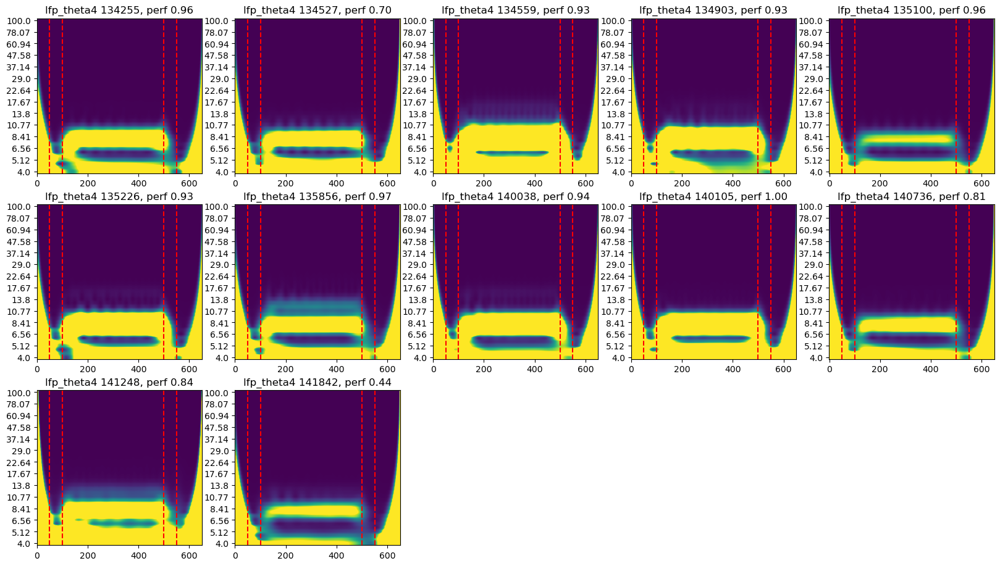

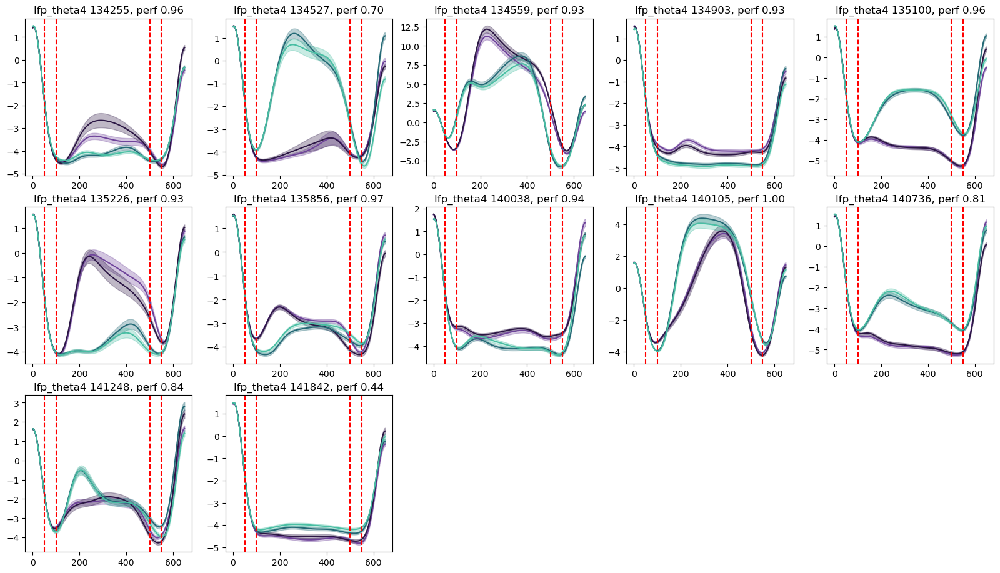

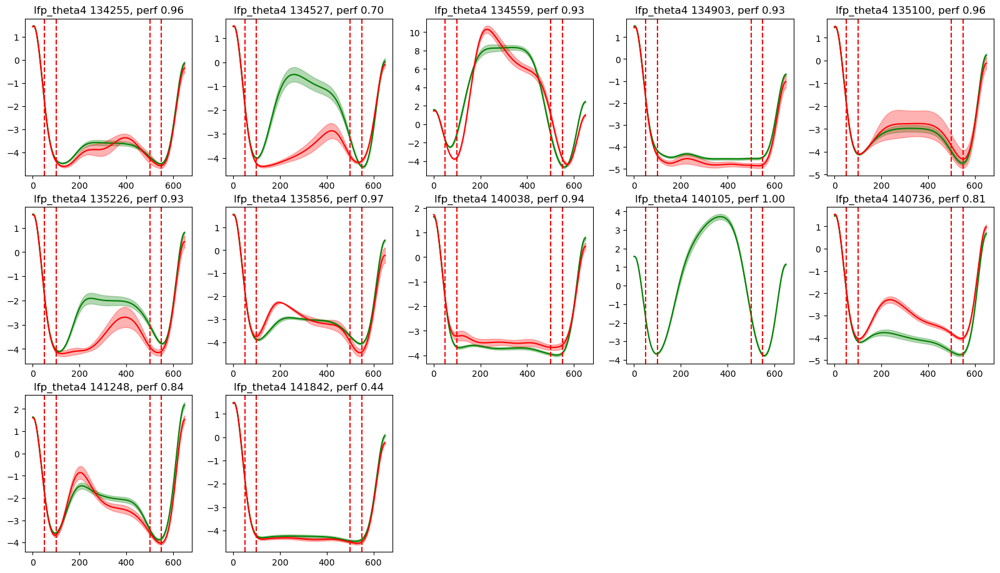

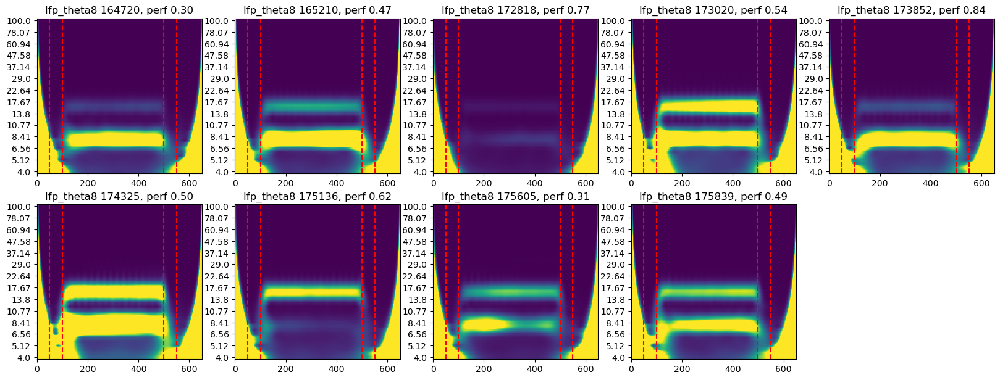

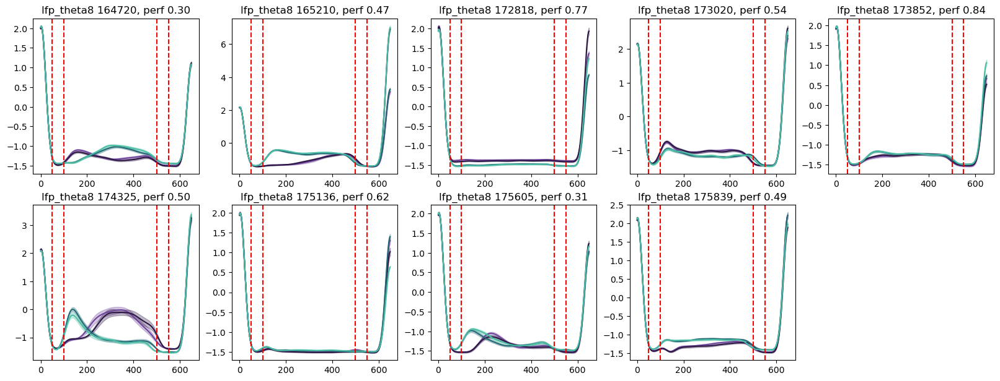

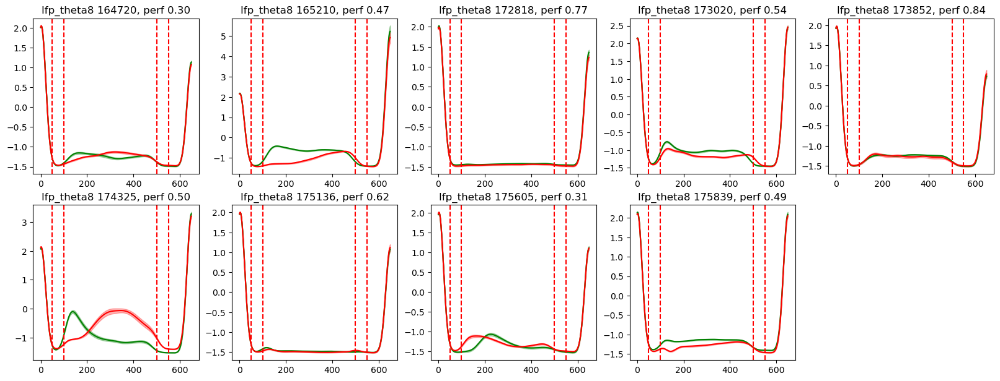

In [ ]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- z-scoring at bandpower step

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] #, lfp_alpha_model_list]
model_dirs = [lfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['lfp_theta4', 'lfp_theta8'] #, 'lfp_alpha']
model_powers = [4, 8]
condn = 'delay400'

for model_list, model_dir, model_list_name, model_power in zip(model_lists, model_dirs, model_list_names, model_powers):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig1 = plt.figure(figsize=(20, 15)) # spectrogram
    fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
    fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = compute_lfp_power(neural_dict['epsp'], settings, freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=True, baseline=[10, 50])
            
        # first plot spectrogram
        ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
        ax1.imshow(np.mean(trial_power, axis=0), aspect='auto', origin='lower',
               vmin=0, vmax=1.2)
        ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
        # ax1.colorbar(label='Power')
        ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # then plot band power, split by trial type
        ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
        stims, colors = ld.get_trialtype_colors()
        trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
        for i, trial_type in enumerate(trial_types):
            trials_idx = (trial_idxs == i)
            powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
            powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
            ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
            ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
        ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # finally plot band power, split by correct/incorrect
        ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
        ax3.plot(powerband_mean, color='g', label='correct')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax3.plot(powerband_mean, color='r', label='incorrect')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
        ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')



##### new models with stim_on=100

In [19]:
# delay400 -- longer fixation period
settings = {
        'T': 700, # trial duration (in steps)
        'stim_on': 100, # input stim onset (in steps)
        'stim_dur': 50, # input stim duration (in steps)
        'delay': 400, # delay b/w the two stimuli (in steps)
        'DeltaT': 1, # sampling rate
        'taus': 20, # decay time-constants (in steps)
        'lfp_power_target': [4], # theta
        'power_target_period': 'delay',
        'fs': 200,
        'task': 'xor', # task name
        }

Processing model type: lfp_theta4, number of models: 12
Processing model type: lfp_theta8, number of models: 9


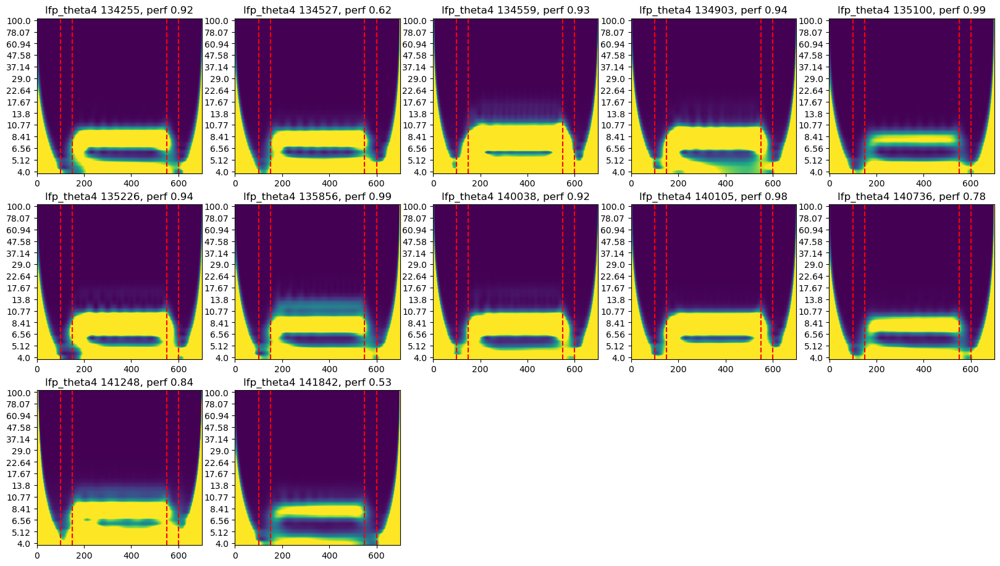

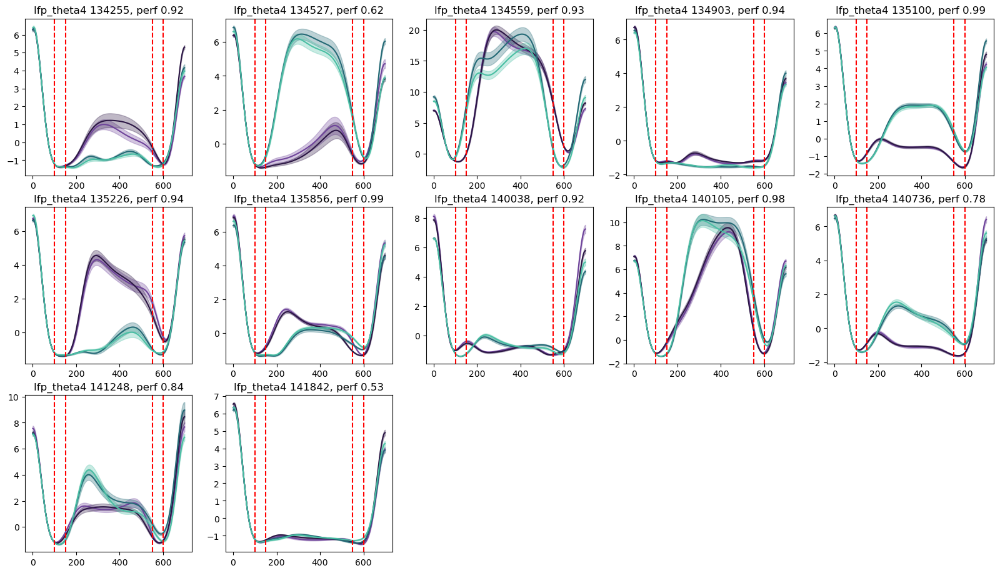

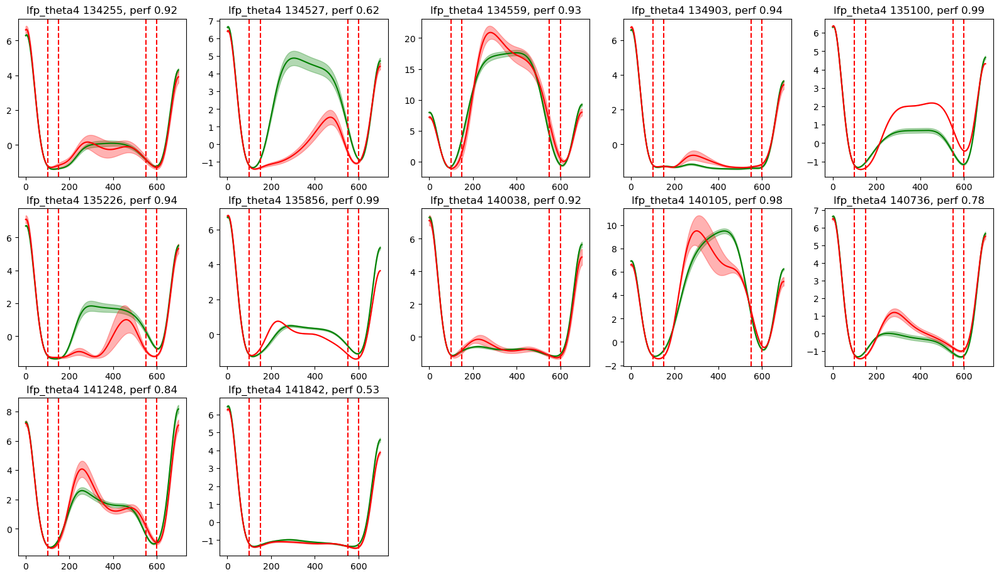

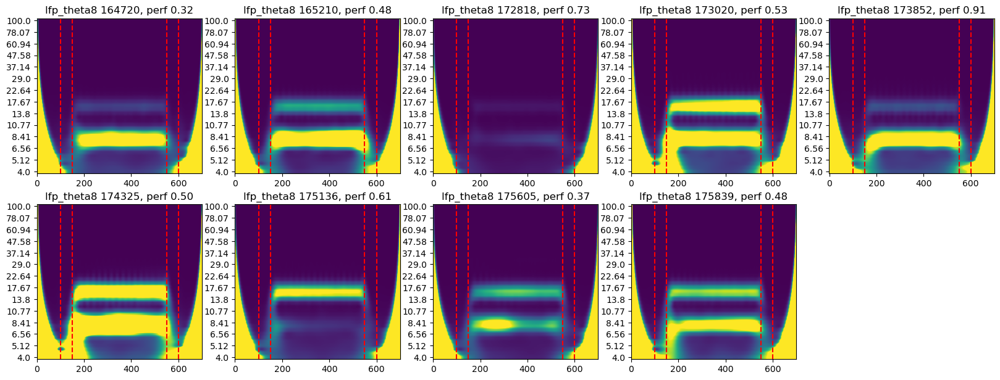

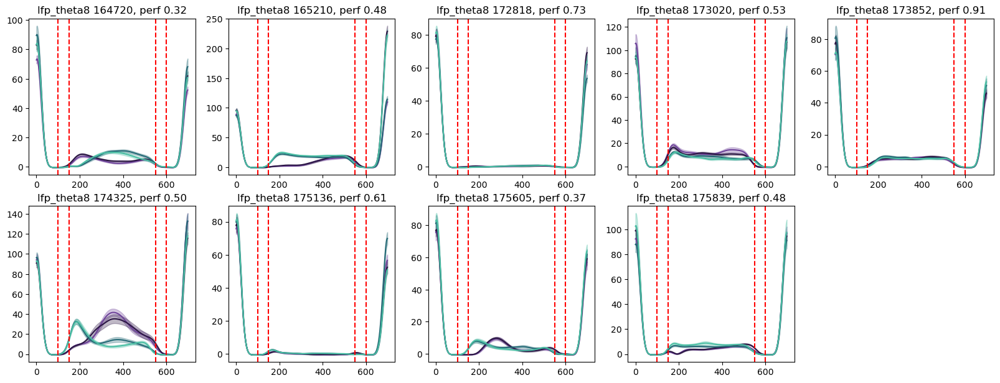

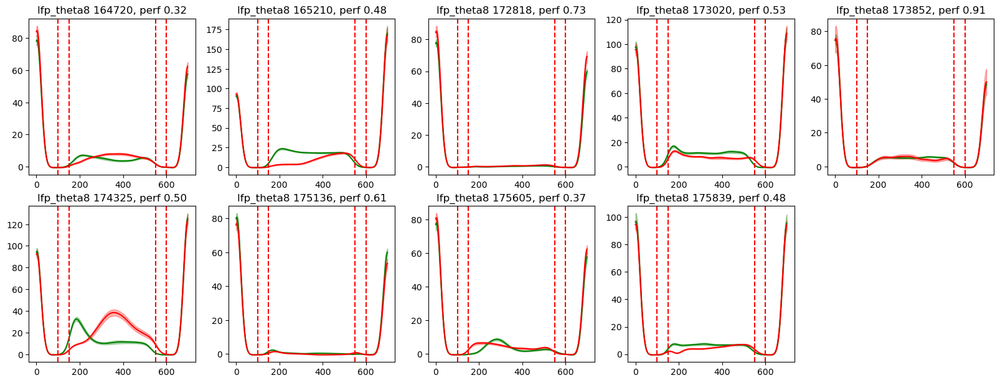

In [21]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- z-score at bandpower step, now longer pre-stim period

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] #, lfp_alpha_model_list]
model_dirs = [lfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['lfp_theta4', 'lfp_theta8'] #, 'lfp_alpha']
model_powers = [4, 8]
condn = 'delay400_stimon100'

for model_list, model_dir, model_list_name, model_power in zip(model_lists, model_dirs, model_list_names, model_powers):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig1 = plt.figure(figsize=(20, 15)) # spectrogram
    fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
    fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = compute_lfp_power(neural_dict['epsp'], settings, freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=True, baseline=[50, 100])
            
        # first plot spectrogram
        ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
        ax1.imshow(np.mean(trial_power, axis=0), aspect='auto', origin='lower',
               vmin=0, vmax=1.2)
        ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
        # ax1.colorbar(label='Power')
        ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # then plot band power, split by trial type
        ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
        stims, colors = ld.get_trialtype_colors()
        trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
        for i, trial_type in enumerate(trial_types):
            trials_idx = (trial_idxs == i)
            powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
            powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
            ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
            ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
        ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # finally plot band power, split by correct/incorrect
        ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
        ax3.plot(powerband_mean, color='g', label='correct')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax3.plot(powerband_mean, color='r', label='incorrect')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
        ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')



Processing model type: lfp_theta4, number of models: 12
Processing model type: lfp_theta8, number of models: 9


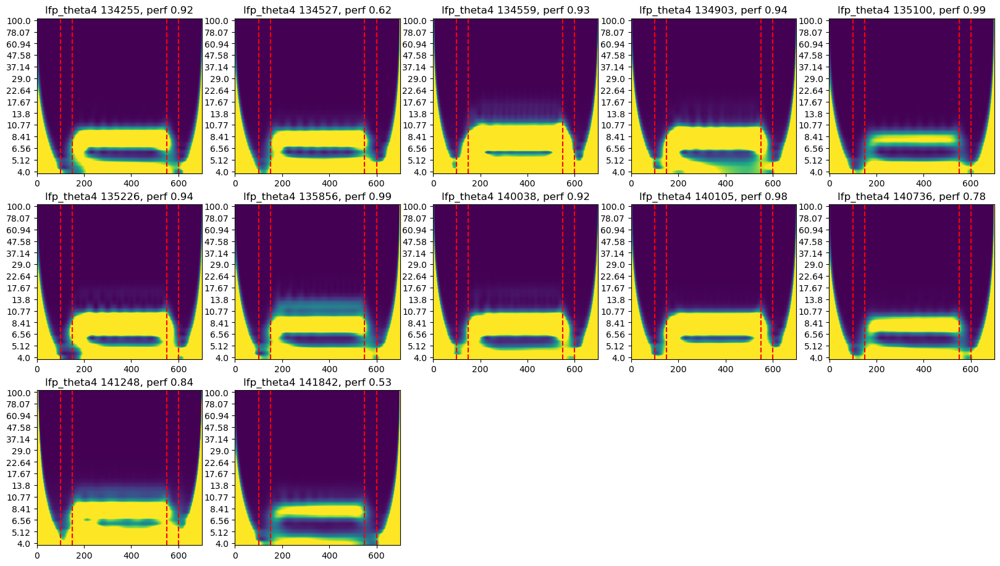

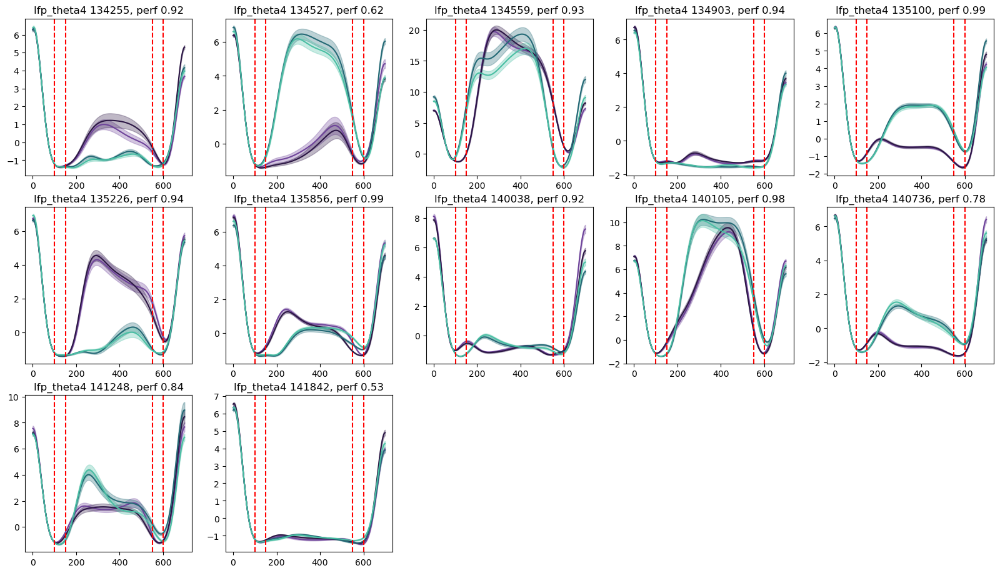

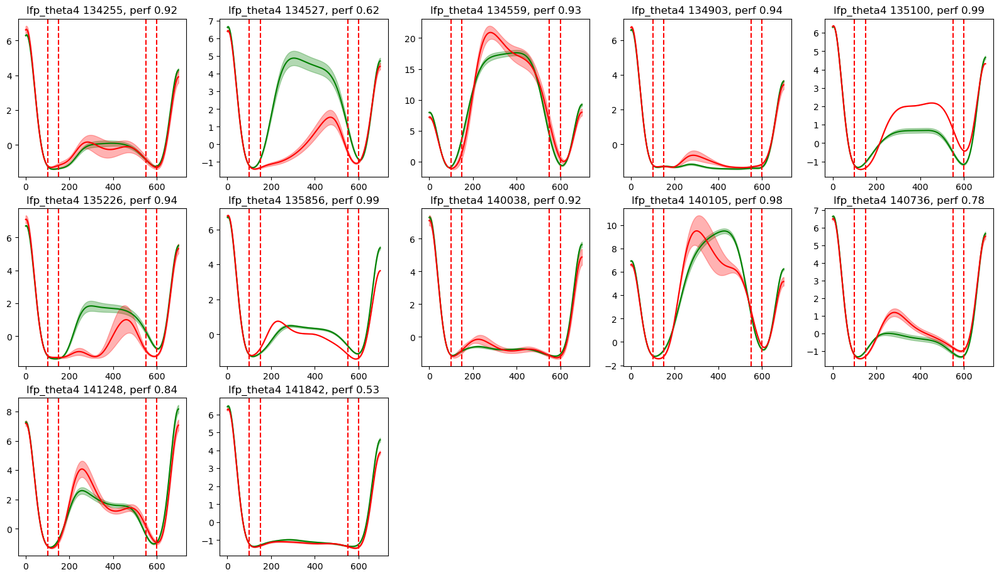

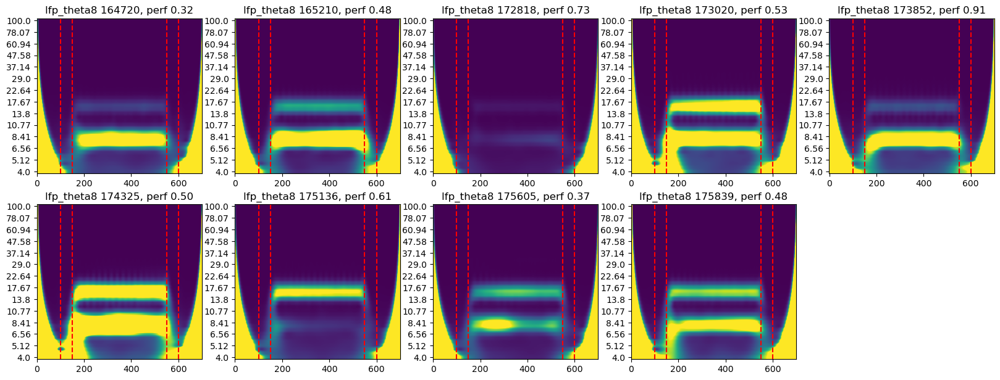

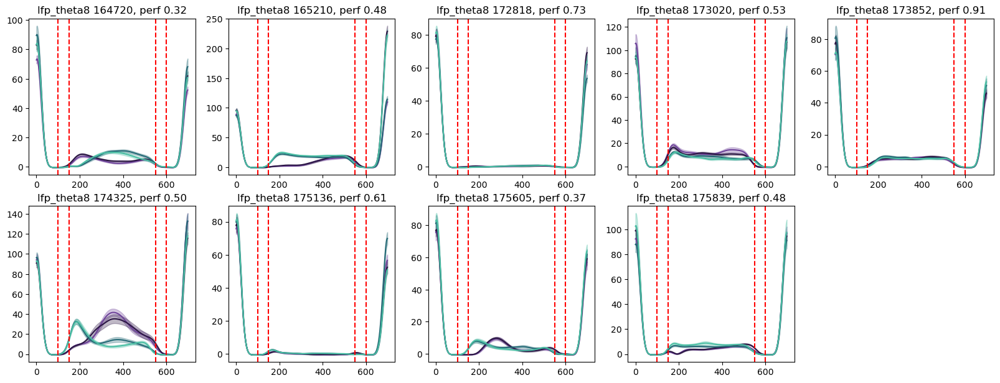

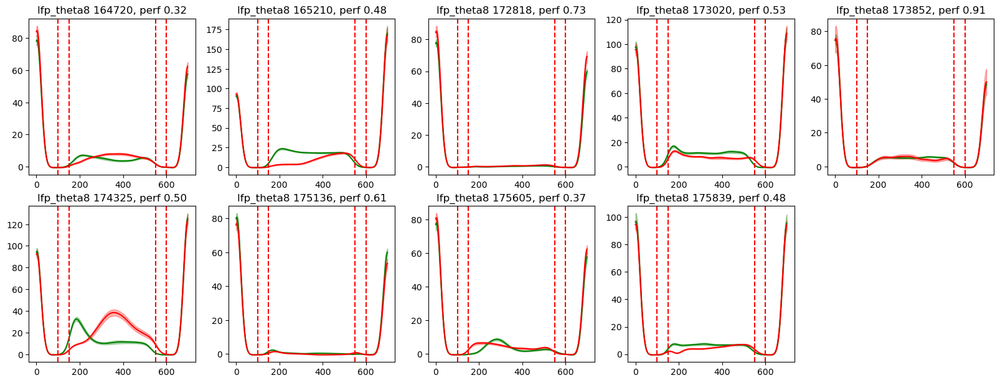

In [ ]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- z-score at bandpower step, now longer pre-stim period

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] #, lfp_alpha_model_list]
model_dirs = [lfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['lfp_theta4', 'lfp_theta8'] #, 'lfp_alpha']
model_powers = [4, 8]
condn = 'delay400_stimon100'

for model_list, model_dir, model_list_name, model_power in zip(model_lists, model_dirs, model_list_names, model_powers):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig1 = plt.figure(figsize=(20, 15)) # spectrogram
    fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
    fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = compute_lfp_power(neural_dict['epsp'], settings, freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=True, baseline=[50, 100])
            
        # first plot spectrogram
        ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
        ax1.imshow(np.mean(trial_power, axis=0), aspect='auto', origin='lower',
               vmin=0, vmax=1.2)
        ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
        # ax1.colorbar(label='Power')
        ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # then plot band power, split by trial type
        ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
        stims, colors = ld.get_trialtype_colors()
        trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
        for i, trial_type in enumerate(trial_types):
            trials_idx = (trial_idxs == i)
            powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
            powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
            ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
            ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
        ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # finally plot band power, split by correct/incorrect
        ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
        ax3.plot(powerband_mean, color='g', label='correct')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax3.plot(powerband_mean, color='r', label='incorrect')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
        ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')



Processing model type: lfp_theta4, number of models: 12
Processing model type: lfp_theta8, number of models: 9


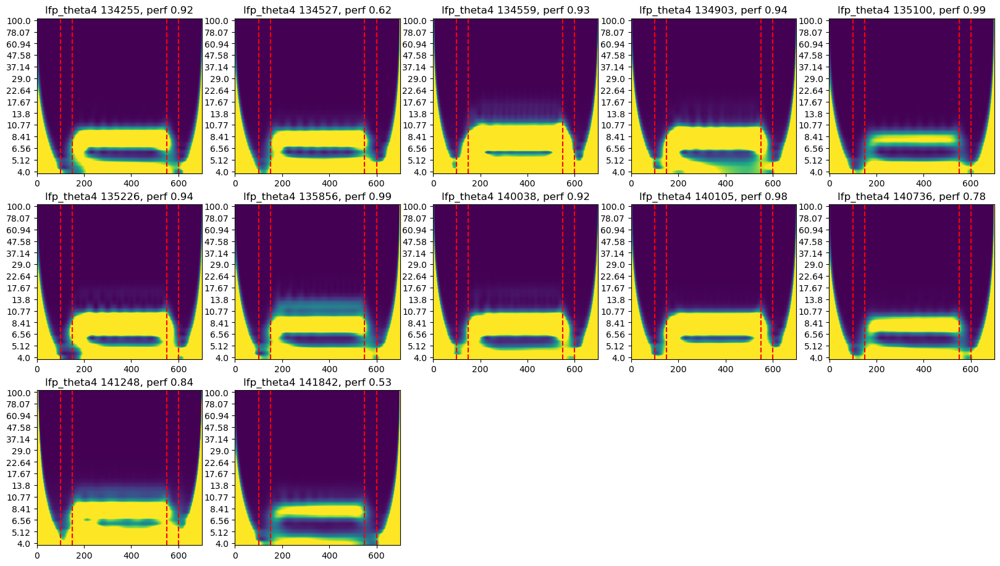

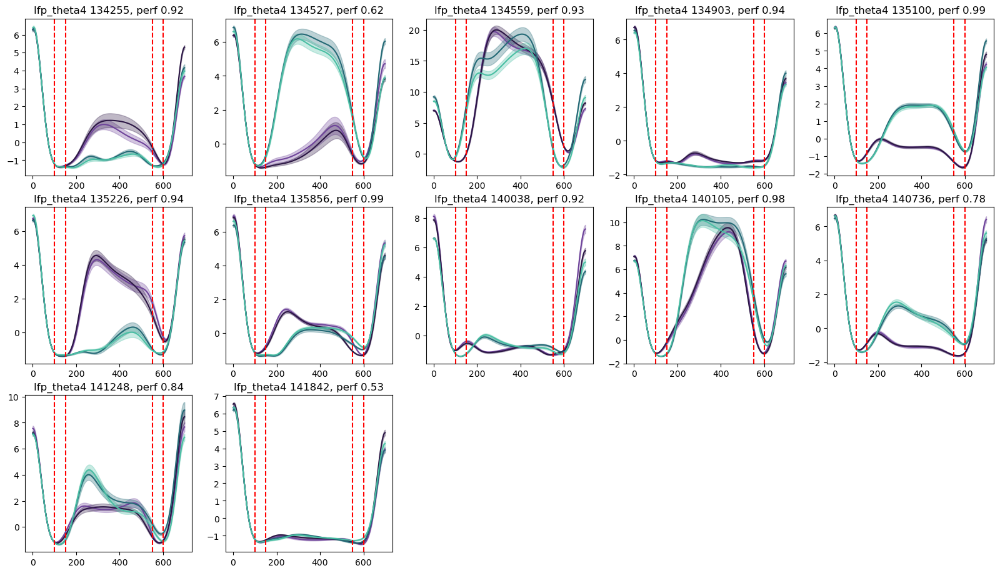

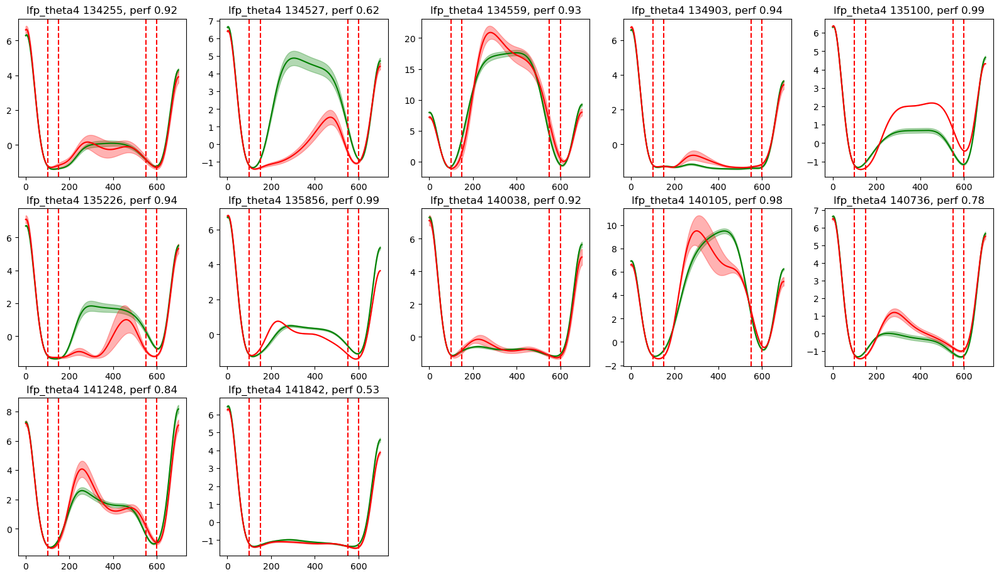

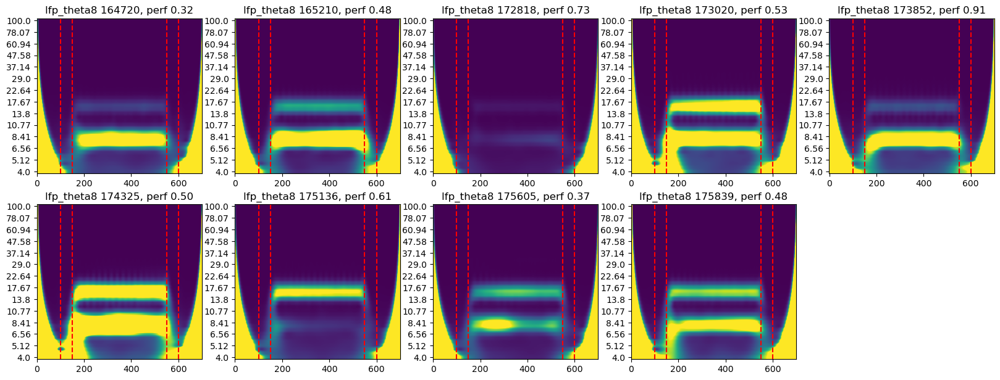

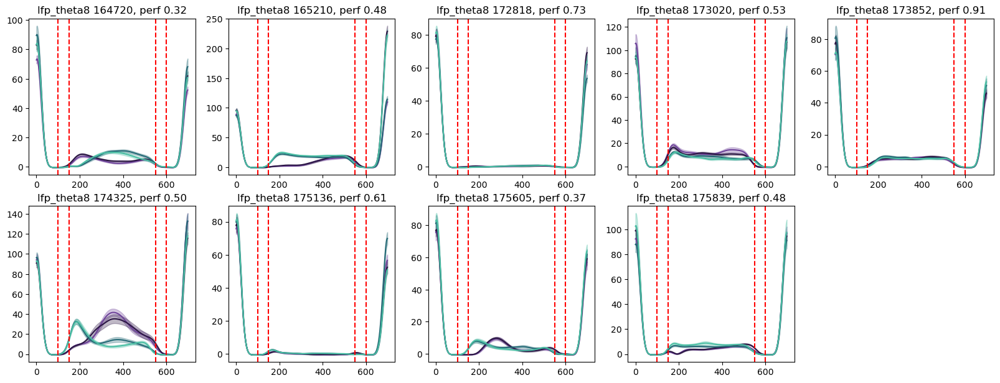

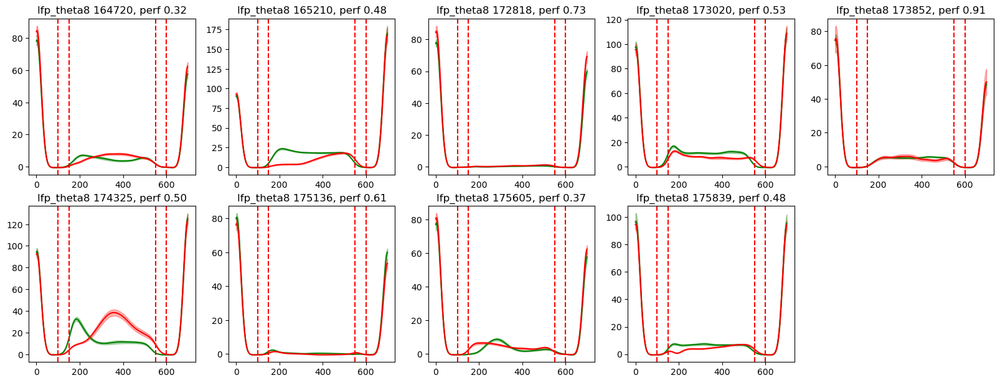

In [ ]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- z-score at bandpower step, now longer pre-stim period

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] #, lfp_alpha_model_list]
model_dirs = [lfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['lfp_theta4', 'lfp_theta8'] #, 'lfp_alpha']
model_powers = [4, 8]
condn = 'delay400_stimon100'

for model_list, model_dir, model_list_name, model_power in zip(model_lists, model_dirs, model_list_names, model_powers):
    settings['lfp_power_target'] = [model_power]

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig1 = plt.figure(figsize=(20, 15)) # spectrogram
    fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
    fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]
        
        trial_power, freqs, phase = compute_lfp_power(neural_dict['epsp'], settings, freq_range = [4, 100], num_freqs = n_freqs, n_cycles=7)
        trial_powerband = compute_bandpower(trial_power, freqs, settings, band=[model_power], zscore=True, baseline=[50, 100])
            
        # first plot spectrogram
        ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
        ax1.imshow(np.mean(trial_power, axis=0), aspect='auto', origin='lower',
               vmin=0, vmax=1.2)
        ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
        # ax1.colorbar(label='Power')
        ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # then plot band power, split by trial type
        ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
        stims, colors = ld.get_trialtype_colors()
        trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
        for i, trial_type in enumerate(trial_types):
            trials_idx = (trial_idxs == i)
            powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
            powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
            ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
            ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
        ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        
        # finally plot band power, split by correct/incorrect
        ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
        ax3.plot(powerband_mean, color='g', label='correct')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax3.plot(powerband_mean, color='r', label='incorrect')
        ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
        ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')



Processing model type: lfp_theta4, number of models: 13
Processing model type: lfp_theta8, number of models: 8


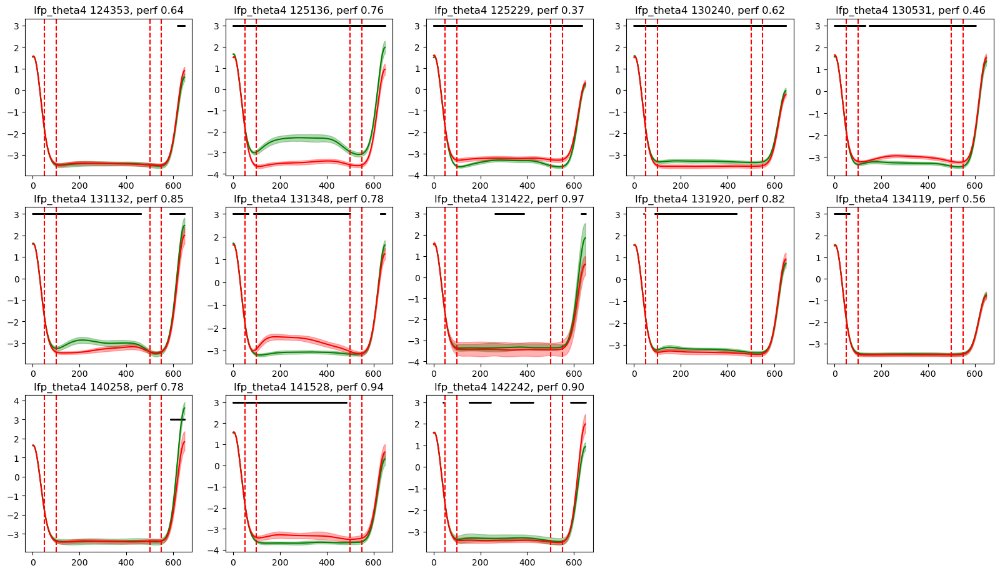

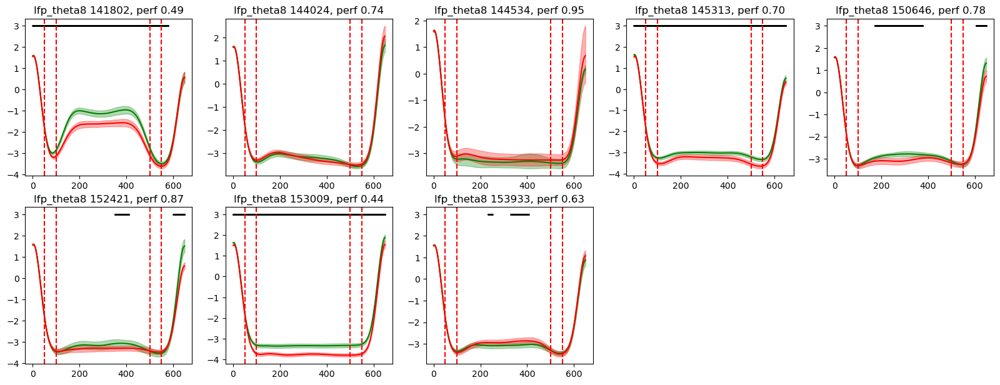

In [20]:
# make plot: bandpower by correct/incorrect w bootstrapping

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

model_lists = [lfp_theta4_model_list, lfp_theta8_model_list] #, lfp_alpha_model_list]
model_dirs = [lfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['lfp_theta4', 'lfp_theta8'] #, 'lfp_alpha']
condn = 'delay400'

for model_lists, model_dirs, model_list_names in zip(model_lists, model_dirs, model_list_names):
    model_list = model_lists
    model_dir = model_dirs
    model_list_name = model_list_names

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')
    
    # create figure
    fig = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

    for model_name in model_list:
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for i in range(n_trials):
            trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
            avg_power += trial_power / n_trials
            
        # finally plot band power, split by correct/incorrect
        ax = fig.add_subplot(4, 5, model_list.index(model_name)+1)
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        
        t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerband[correct_trials, :], 
                                                                                               trial_powerband[incorrect_trials, :], 
                                                                                               nboot, CI_int, n_jobs=-1, random_seed=None)
        
        ax.plot(t1_avg.mean(axis=1), color='g', label='correct')
        ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='g', alpha=0.3)
        powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
        powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
        ax.plot(t2_avg.mean(axis=1), color='r', label='incorrect')
        ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='r', alpha=0.3)
        # plot bar for significant difference
        sig_idx = np.where(p_diff < 0.05)[0]
        ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
        ax.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
        ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')

